In [1]:
import numpy as np
import pandas as pd
import warnings
with warnings.catch_warnings():
    # suppress deprecation warnings
    warnings.simplefilter('ignore')
    import holoviews as hv
    hv.notebook_extension('seaborn')

In [2]:
df = pd.read_csv('data/MIST_good_allruns.csv', usecols=[1,2,3,4,5,6,8])
# do some trimming
df = df.where((df.age_bin >= 8.85) & (df.filt != "WFIRST_X606")).dropna()
# get rid of 'WFIRST_' from filter column
df['filt'] = df['filt'].str.split('_').str[-1]
# get cumulative sum of each differential mass
df = df.assign(mass_formed = df.groupby(['filt','dist','age','feh','runs']).massdiff.transform(np.cumsum))
df.head()

,filt,dist,age,feh,runs,age_bin,massdiff,mass_formed
43190,X625,4.0,9.3,-2.2,1.0,8.85,0.0,0.0
43191,X625,4.0,9.3,-2.2,1.0,8.90,0.0,0.0
43192,X625,4.0,9.3,-2.2,1.0,8.95,0.0,0.0
43193,X625,4.0,9.3,-2.2,1.0,9.00,0.0,0.0
43194,X625,4.0,9.3,-2.2,1.0,9.05,0.0,0.0


In [3]:
# dimensions & labels
kdims = [('filt', 'Filter'), ('dist', 'Distance (Mpc)'),
         ('age', 'Input age (log yr)'),
         ('feh', 'Input [Fe/H]'), ('runs', 'Run')]
vdims = [('age_bin', 'Age (log yr)'),
         ('massdiff', 'Fraction of mass in age bin'),
         ('mass_formed', 'Fraction of mass formed')]

In [4]:
# get SFHs
sfhs = hv.Table(df, kdims=kdims, vdims=vdims).to.curve('Age (log yr)', 'Fraction of mass formed')

b':HoloMap   [filt,dist,age,feh]\n   :NdOverlay   [runs]\n      :Curve   [age_bin]   (mass_formed)'
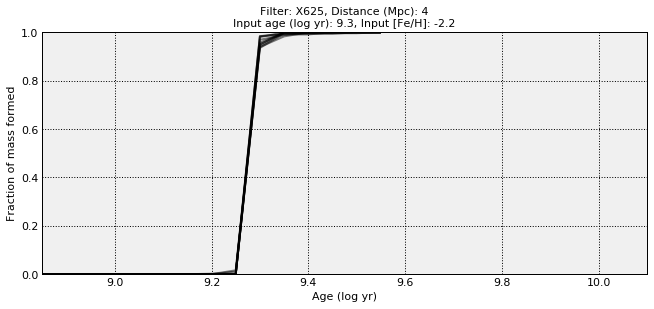
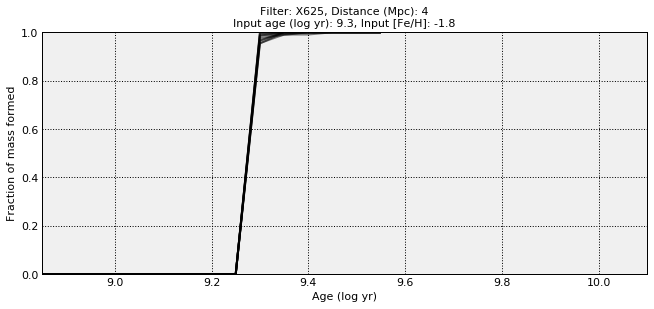
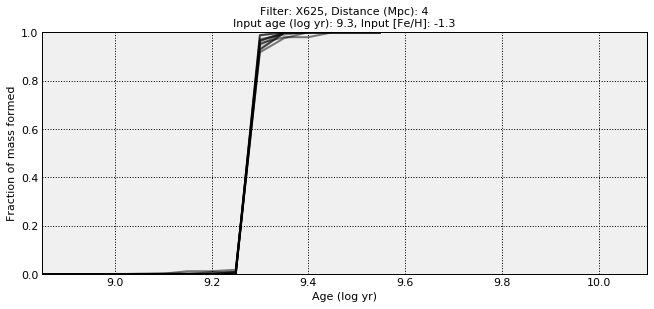
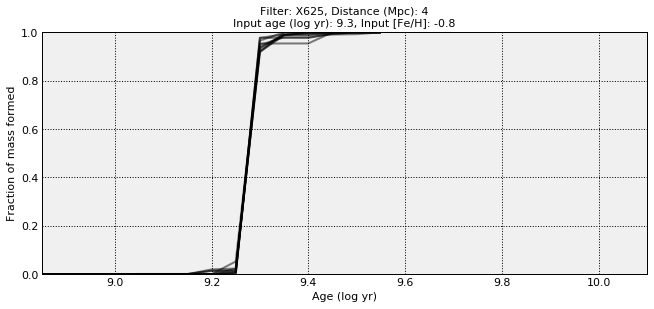
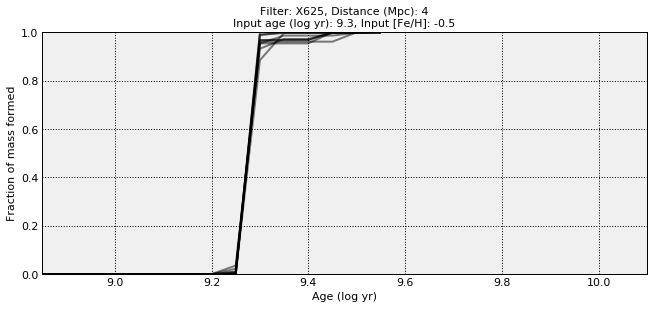
...
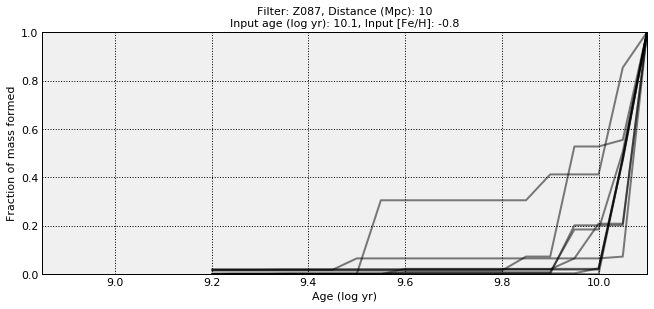
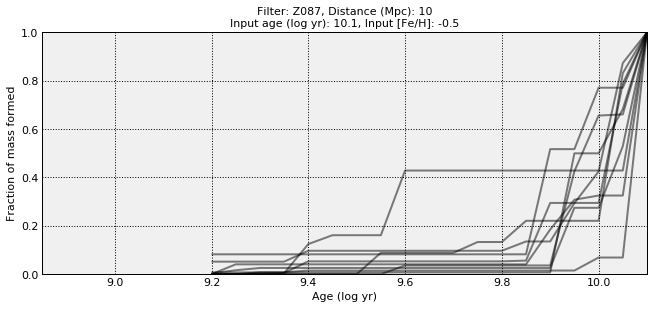
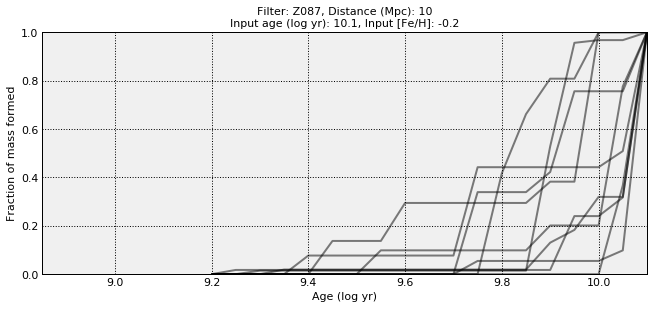
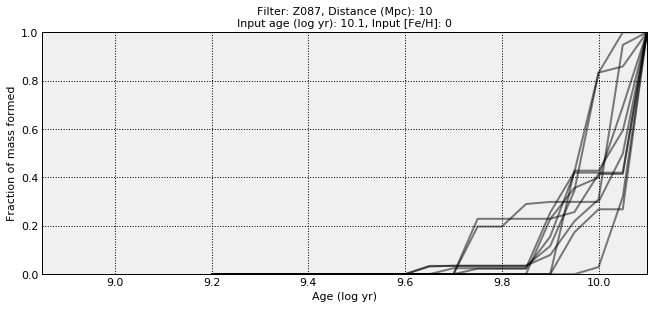
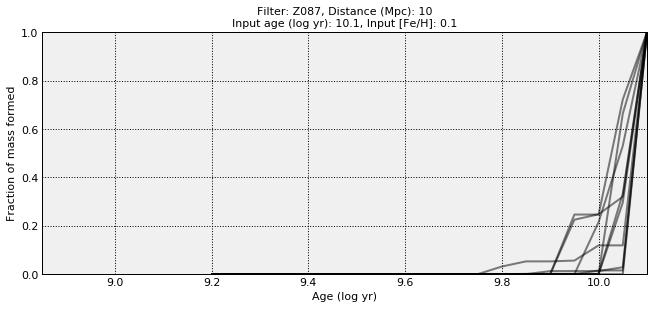

In [5]:
%opts Curve [fig_size=300 aspect=2.5 show_legend=False] (color='black' alpha=0.5)
# show SFH from each run
sfhs.overlay('Run')